Базовые алгоритмы обучения без учителя и работа с текстовыми данными

1. Понижение размерности и визуализация данных

In [1]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import plotly.express as px

In [2]:
df = pd.read_csv("BankChurners.csv")
df = df.drop('Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',axis=1)
df = df.drop('Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2',axis=1)

In [3]:
df.head(10)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
5,713061558,Existing Customer,44,M,2,Graduate,Married,$40K - $60K,Blue,36,...,1,2,4010.0,1247,2763.0,1.376,1088,24,0.846,0.311
6,810347208,Existing Customer,51,M,4,Unknown,Married,$120K +,Gold,46,...,1,3,34516.0,2264,32252.0,1.975,1330,31,0.722,0.066
7,818906208,Existing Customer,32,M,0,High School,Unknown,$60K - $80K,Silver,27,...,2,2,29081.0,1396,27685.0,2.204,1538,36,0.714,0.048
8,710930508,Existing Customer,37,M,3,Uneducated,Single,$60K - $80K,Blue,36,...,2,0,22352.0,2517,19835.0,3.355,1350,24,1.182,0.113
9,719661558,Existing Customer,48,M,2,Graduate,Single,$80K - $120K,Blue,36,...,3,3,11656.0,1677,9979.0,1.524,1441,32,0.882,0.144


In [4]:
df = df.dropna()

def Attrition_Flag(val):    
    if val == 'Existing Customer':
        return 0
    else:
        return 1

def Gender(val):    
    if val == 'M':
        return 0
    return 1

df['Attrition_Flag'] = df['Attrition_Flag'].apply(Attrition_Flag)
df['Gender'] = df['Gender'].apply(Gender)
df.head(10)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,0,45,0,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,0,49,1,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,0,51,0,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,0,40,1,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,0,40,0,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
5,713061558,0,44,0,2,Graduate,Married,$40K - $60K,Blue,36,...,1,2,4010.0,1247,2763.0,1.376,1088,24,0.846,0.311
6,810347208,0,51,0,4,Unknown,Married,$120K +,Gold,46,...,1,3,34516.0,2264,32252.0,1.975,1330,31,0.722,0.066
7,818906208,0,32,0,0,High School,Unknown,$60K - $80K,Silver,27,...,2,2,29081.0,1396,27685.0,2.204,1538,36,0.714,0.048
8,710930508,0,37,0,3,Uneducated,Single,$60K - $80K,Blue,36,...,2,0,22352.0,2517,19835.0,3.355,1350,24,1.182,0.113
9,719661558,0,48,0,2,Graduate,Single,$80K - $120K,Blue,36,...,3,3,11656.0,1677,9979.0,1.524,1441,32,0.882,0.144


In [5]:
df['Education_Level'] = pd.Categorical(df['Education_Level'])
df['Marital_Status'] = pd.Categorical(df['Marital_Status'])
df['Income_Category'] = pd.Categorical(df['Income_Category'])
df['Card_Category'] = pd.Categorical(df['Card_Category'])
df['Avg_Utilization_Ratio'] = df['Avg_Utilization_Ratio'].astype(np.int64)

In [6]:
for column in df.select_dtypes(include='category').columns:
    if column=='Income_Category':
        continue
    df = pd.concat([df, pd.get_dummies(df[column], prefix=column)],axis=1)
    df.drop([column],axis=1, inplace=True)

In [7]:
X_train, X_test, Y_train, Y_test = train_test_split(df.drop('Income_Category', axis=1), df['Income_Category'], test_size=0.2, random_state=42)

In [8]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_train)

In [9]:
picture = px.scatter(X_pca, x=0, y=1, title = 'PCA', color=Y_train)
picture.show()

In [10]:
tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(X_train)

In [11]:
picture2 = px.scatter(X_tsne, x=0, y=1, title = 'TSNE', color=Y_train)
picture2.show()

2. Кластерный анализ

In [12]:
from PIL import Image
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin
from sklearn.datasets import load_sample_image
from sklearn.utils import shuffle
from time import time

In [13]:
n_colors = [64, 32, 16, 8]
subsample_size = 0.01

In [14]:
penguin = Image.open('penguin.jpg')
penguin = np.array(penguin, dtype=np.float64) / 255


In [15]:
w, h, d = original_shape = tuple(penguin.shape)
assert d == 3
image_array = np.reshape(penguin, (w * h, d))
image_array_sample = shuffle(image_array, random_state=0)[:1000]

In [16]:
new_array = []
for color in n_colors:
    kmeans = KMeans(n_clusters=color, random_state=0).fit(image_array_sample)
    new_array.append(kmeans)

In [17]:
def recreate_image(codebook, labels, w, h):
    """Recreate the (compressed) image from the code book & labels"""
    d = codebook.shape[1]
    image = np.zeros((w, h, d))
    label_idx = 0
    for i in range(w):
        for j in range(h):
            image[i][j] = codebook[labels[label_idx]]
            label_idx += 1
    return image

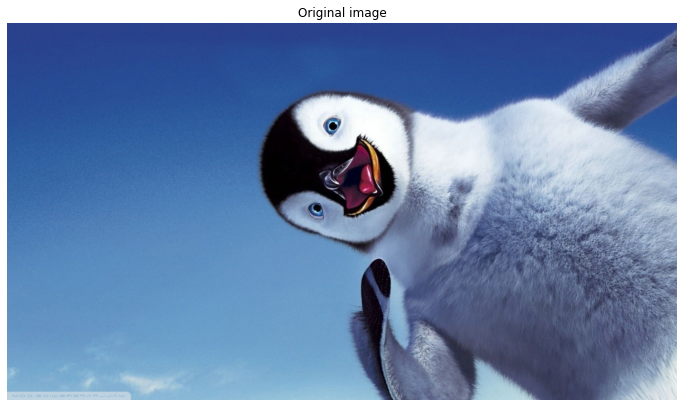

In [18]:
plt.figure(figsize=(12,9))
plt.clf()
plt.axis('off')
plt.title('Original image')
plt.imshow(penguin) 

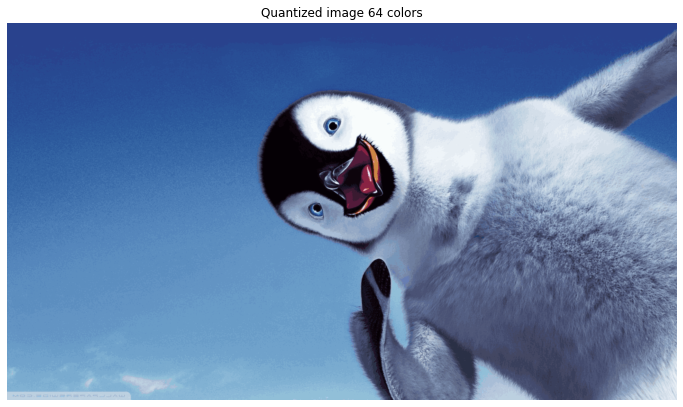

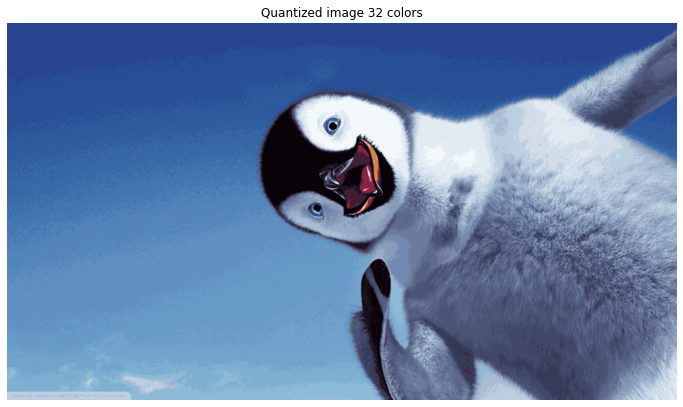

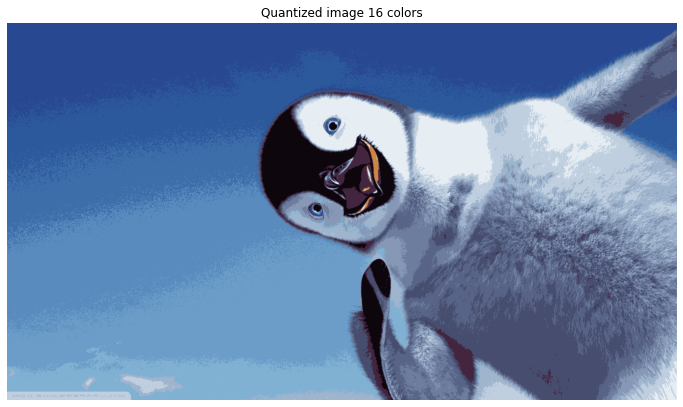

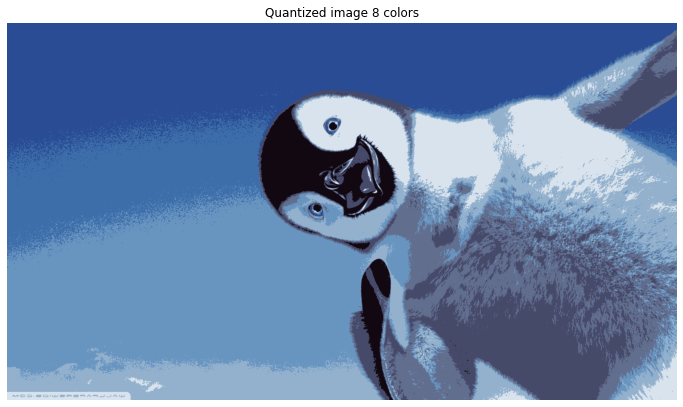

In [19]:
for item in new_array:
    labels = item.predict(image_array)
    plt.figure(figsize=(12,9))
    plt.clf()
    plt.axis('off')
    plt.title(f'Quantized image {item.get_params().get("n_clusters")} colors')
    plt.imshow(recreate_image(item.cluster_centers_, labels, w, h))

In [20]:
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

In [21]:
X, Y = make_blobs(n_samples=2000, n_features=2, centers=6, cluster_std=1, center_box=(-11.0, 11.0), shuffle=True, random_state=0)

In [22]:
range_n_clusters = [5, 6, 7]

For n_clusters = 5 The average silhouette_score is : 0.5214043866708964
For n_clusters = 6 The average silhouette_score is : 0.5447327696101298
For n_clusters = 7 The average silhouette_score is : 0.4971100976933239


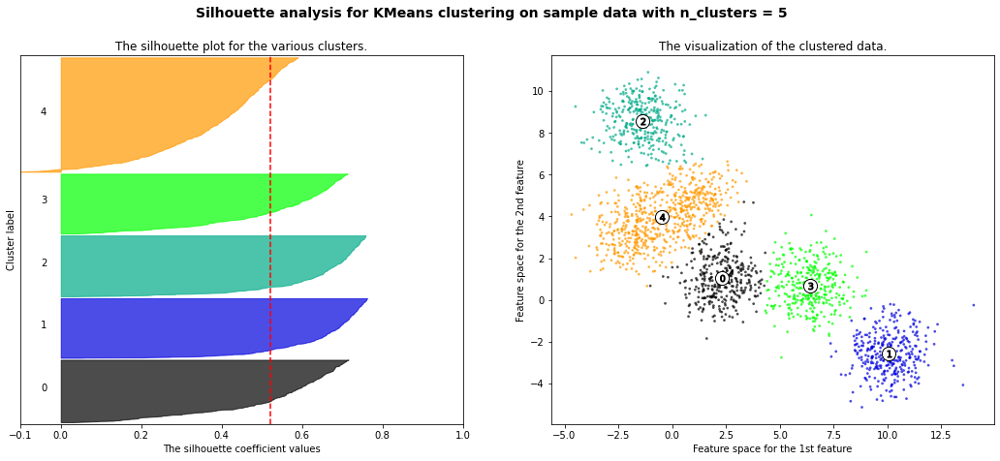

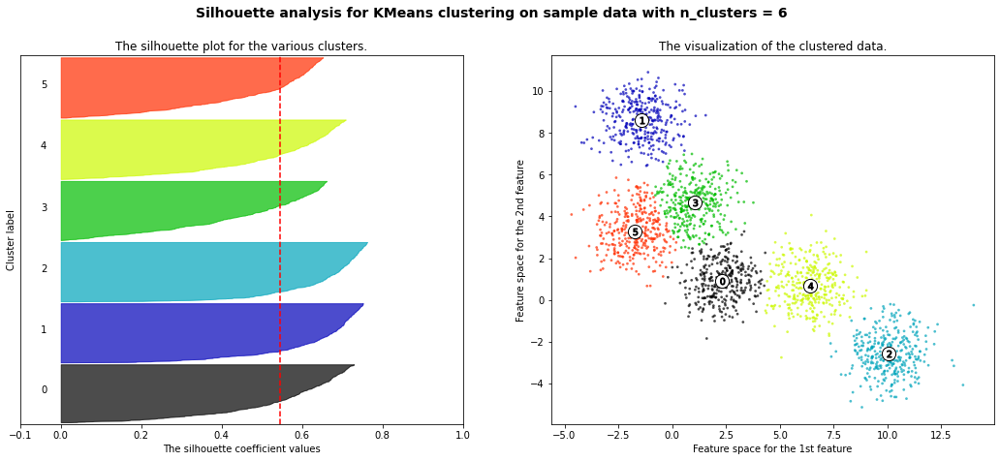

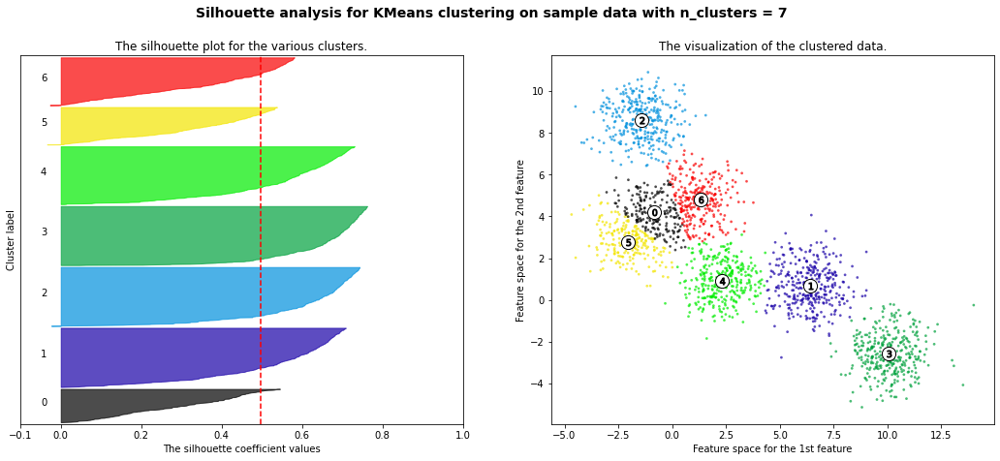

In [23]:
for n_clusters in range_n_clusters:
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])


    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    centers = clusterer.cluster_centers_
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

В данном случае вариант с 6 кластерами выглядит лучше всего (за счет одинакового размера кластеров и отсутствие отрицательных значений)


In [24]:
from sklearn.mixture import GaussianMixture
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from numpy.random import multivariate_normal

In [25]:
mean1 = (1, 3)
cov1 = [[2, 0], [0, 2]]
x1 = multivariate_normal(mean1, cov1, 1000)

mean2 = (4, 8)
cov2 = [[4, 0], [0, 3]]
x2 = multivariate_normal(mean2, cov2, 1000)

X = np.vstack([x1,x2])

In [26]:
gm = GaussianMixture(n_components=2, covariance_type='diag')
predicts = gm.fit_predict(X)

<AxesSubplot:>

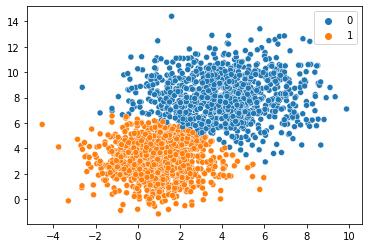

In [27]:
sns.scatterplot(x=X[:,0], y=X[:,1], hue=predicts)

In [28]:
x1_recovered = multivariate_normal(gm.means_[0], np.diag(gm.covariances_[0]), 1000)
x2_recovered = multivariate_normal(gm.means_[1], np.diag(gm.covariances_[1]), 1000)
X_recovered = np.vstack([x1_recovered, x2_recovered])

<AxesSubplot:>

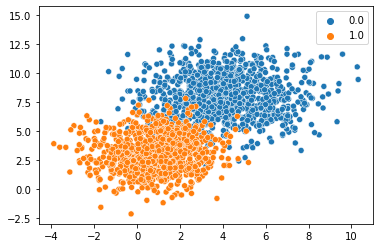

In [29]:
sns.scatterplot(x=X_recovered[:,0], y=X_recovered[:,1], hue=np.hstack([np.zeros((1000)),np.ones((1000))]))

3. Обработка текстовых данных

In [94]:
messages = pd.read_csv('spam.csv', encoding='latin-1')
messages.drop(['Unnamed: 2','Unnamed: 3','Unnamed: 4'],axis=1,inplace=True)
messages = messages.rename(columns={'v1': 'classColumn','v2': 'text'})

In [95]:
messages.head(10)

,classColumn,text
0,ham,"Go until jurong point, crazy.. Available only ..."
1,ham,Ok lar... Joking wif u oni...
2,spam,Free entry in 2 a wkly comp to win FA Cup fina...
3,ham,U dun say so early hor... U c already then say...
4,ham,"Nah I don't think he goes to usf, he lives aro..."
5,spam,FreeMsg Hey there darling it's been 3 week's n...
6,ham,Even my brother is not like to speak with me. ...
7,ham,As per your request 'Melle Melle (Oru Minnamin...
8,spam,WINNER!! As a valued network customer you have...
9,spam,Had your mobile 11 months or more? U R entitle...


In [96]:
def classColumn(val):    
    if val == 'ham':
        return 0
    else:
        return 1

messages['classColumn'] = messages['classColumn'].apply(classColumn)
messages.head(10)

,classColumn,text
0,0,"Go until jurong point, crazy.. Available only ..."
1,0,Ok lar... Joking wif u oni...
2,1,Free entry in 2 a wkly comp to win FA Cup fina...
3,0,U dun say so early hor... U c already then say...
4,0,"Nah I don't think he goes to usf, he lives aro..."
5,1,FreeMsg Hey there darling it's been 3 week's n...
6,0,Even my brother is not like to speak with me. ...
7,0,As per your request 'Melle Melle (Oru Minnamin...
8,1,WINNER!! As a valued network customer you have...
9,1,Had your mobile 11 months or more? U R entitle...


In [97]:
messages['text'] = messages['text'].str.lower()
messages['text'] = messages['text'].str.strip()

In [98]:
import string
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
nltk.download('wordnet')
nltk.download('stopwords')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Zoryana\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Zoryana\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [99]:
table = str.maketrans('', '', string.punctuation)
messages['text'] = messages['text'].str.translate(table)

In [100]:
lemmatizer = WordNetLemmatizer()
messages['text'] = messages['text'].apply(lambda x: ' '.join([lemmatizer.lemmatize(word) for word in x.split()]))

In [101]:
stop_words = stopwords.words('english')
messages['text'] = messages['text'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))

In [102]:
messages.head(10)

,classColumn,text
0,0,go jurong point crazy available bugis n great ...
1,0,ok lar joking wif u oni
2,1,free entry 2 wkly comp win fa cup final tkts 2...
3,0,u dun say early hor u c already say
4,0,nah dont think go usf life around though
5,1,freemsg hey darling 3 week word back id like f...
6,0,even brother like speak treat like aid patent
7,0,per request melle melle oru minnaminunginte nu...
8,1,winner valued network customer selected receiv...
9,1,mobile 11 month u r entitled update latest col...


In [110]:
text0 = messages[messages['classColumn']==0].text.values
text1 = messages[messages['classColumn']==1].text.values

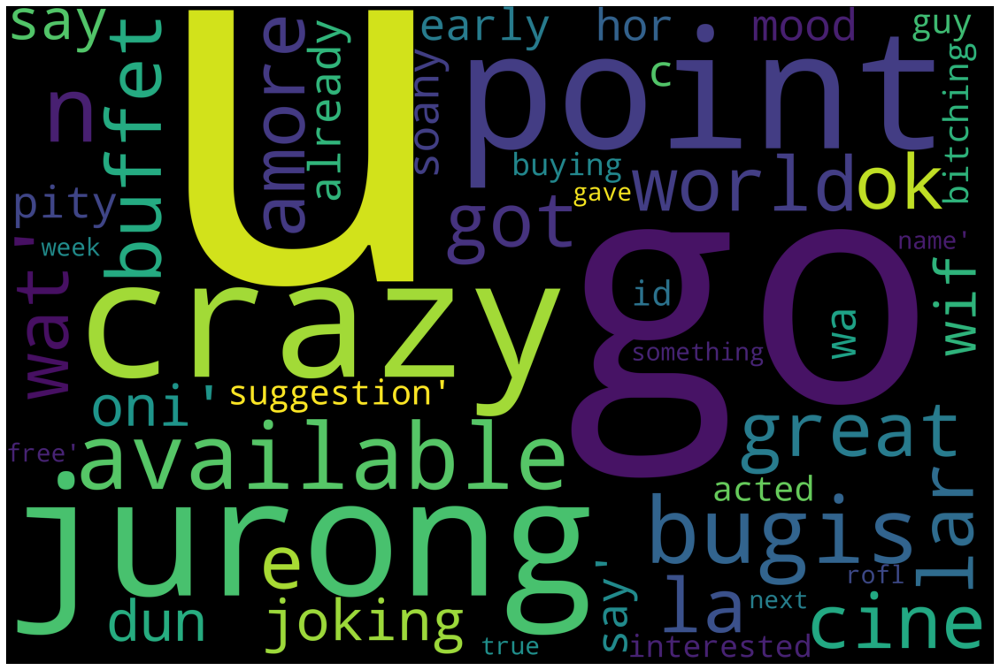

In [112]:
wordCloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black').generate(str(text0))
plt.figure(figsize=(20,15))
plt.axis("off")
plt.imshow(wordCloud)

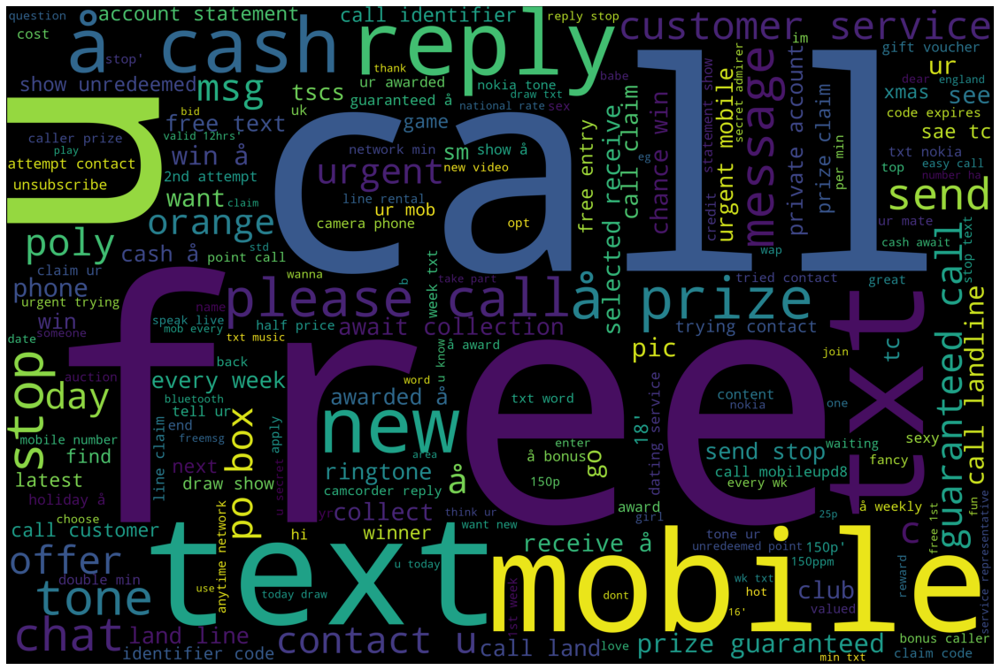

In [115]:
wordCloud1 = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black').generate(str(text1))
plt.figure(figsize=(20,15))
plt.axis("off")
plt.imshow(wordCloud1)

In [116]:
x = TfidfVectorizer(max_features=8000).fit_transform(messages['text'])
y = messages['classColumn']

In [117]:
X_train,X_test,y_train,y_test = train_test_split(x, y, test_size=0.2, random_state=42)

model = MultinomialNB().fit(X_train, y_train)
prediction = model.predict(X_test)
print("accuracy: {}%".format(round(accuracy_score(y_test, prediction)*100,2)))

accuracy: 96.59%
